# MVTec AD - Exploratory Data Analysis

**Project:** visual anomaly detection for factory quality inspection
**Phase:** week 1 of 4 - understanding the data before any modelling

MVTec AD is a benchmark for *unsupervised* industrial anomaly detection: 15 product
categories photographed under controlled factory-like conditions, with pixel-accurate
masks marking every defect in the test set.

This notebook answers five questions, in order:

1. **What is actually in the dataset?** - inventory and integrity checks
2. **How is it split?** - and why that split rules out ordinary classification
3. **What do the products and defects look like?** - categories and defect taxonomy
4. **How were the images acquired?** - resolution, colour, brightness
5. **How big and where are the defects?** - the geometry that constrains model design

Each section ends with the modelling consequence, and the closing section collects those
consequences into a plan for week 2.

## 0 - Setup

All analysis reads two pre-computed tables so the notebook stays fast. Regenerate them
with `python scripts/01_build_manifest.py` then `python scripts/02_compute_stats.py`.

In [1]:
import sys
from pathlib import Path

sys.path.insert(0, str(Path.cwd().parent / "src"))

import numpy as np
import pandas as pd

from mvtec_eda import plots
from mvtec_eda.config import TABLES_DIR, get_data_root
from mvtec_eda.manifest import audit_manifest
from mvtec_eda.summaries import category_summary, defect_type_summary, headline_facts
from IPython.display import Image

pd.set_option("display.width", 200)
pd.set_option("display.max_columns", 40)
plots.apply_style()

manifest = pd.read_csv(TABLES_DIR / "manifest.csv")
images = pd.read_csv(TABLES_DIR / "image_stats.csv")
masks = pd.read_csv(TABLES_DIR / "mask_stats.csv")

print(f"dataset root : {get_data_root()}")
print(f"manifest     : {manifest.shape[0]:,} images x {manifest.shape[1]} columns")
print(f"image stats  : {images.shape[0]:,} rows")
print(f"mask stats   : {masks.shape[0]:,} rows")

dataset root : C:\Users\abdel\Downloads\mvtec_anomaly_detection
manifest     : 5,354 images x 15 columns
image stats  : 5,354 rows
mask stats   : 1,258 rows


## 1 - Inventory and integrity

Before drawing any conclusion from the data, confirm the copy on disk is complete and
matches the published description of MVTec AD. The manifest holds one row per image;
every check below should pass on an intact download.

In [2]:
manifest.head()

,category,category_type,split,defect_type,label,is_anomalous,image_path,mask_path,has_mask,width,height,resolution,aspect_ratio,pil_mode,file_size_kb
0,bottle,object,test,broken_large,anomalous,1,bottle/test/broken_large/000.png,bottle/ground_truth/broken_large/000_mask.png,1,900,900,900x900,1.0,RGB,513.67
1,bottle,object,test,broken_large,anomalous,1,bottle/test/broken_large/001.png,bottle/ground_truth/broken_large/001_mask.png,1,900,900,900x900,1.0,RGB,513.34
2,bottle,object,test,broken_large,anomalous,1,bottle/test/broken_large/002.png,bottle/ground_truth/broken_large/002_mask.png,1,900,900,900x900,1.0,RGB,503.53
3,bottle,object,test,broken_large,anomalous,1,bottle/test/broken_large/003.png,bottle/ground_truth/broken_large/003_mask.png,1,900,900,900x900,1.0,RGB,477.12
4,bottle,object,test,broken_large,anomalous,1,bottle/test/broken_large/004.png,bottle/ground_truth/broken_large/004_mask.png,1,900,900,900x900,1.0,RGB,537.10


In [3]:
audit = audit_manifest(manifest)
for key, value in audit.items():
    print(f"{key:<28} {value}")

n_images                     5354
n_categories                 15
n_train                      3629
n_test                       1725
train_defect_types           ['good']
train_contains_anomalies     False
n_test_good                  467
n_test_anomalous             1258
n_masks_found                1258
anomalous_test_missing_mask  0
duplicate_paths              0
n_distinct_resolutions       6
pil_modes                    ['L', 'RGB']


Three of these lines matter more than the rest:

- `train_defect_types: ['good']` - the training split contains **only** defect-free images.
- `anomalous_test_missing_mask: 0` - every defective test image has a ground-truth mask.
- `duplicate_paths: 0` - no image is counted twice.

The copy is intact, so the numbers below can be trusted.

## 2 - How the data is split

This is the single most important structural fact about MVTec AD, and it decides the
whole modelling approach.

In [4]:
split_table = pd.DataFrame(
    {
        "images": [
            (manifest.split == "train").sum(),
            ((manifest.split == "test") & (manifest.is_anomalous == 0)).sum(),
            ((manifest.split == "test") & (manifest.is_anomalous == 1)).sum(),
        ]
    },
    index=["train (normal)", "test (normal)", "test (anomalous)"],
)
split_table["share_%"] = (100 * split_table.images / len(manifest)).round(1)
split_table

,images,share_%
train (normal),3629,67.8
test (normal),467,8.7
test (anomalous),1258,23.5


In [5]:
anomalies_in_train = int(manifest[manifest.split == "train"].is_anomalous.sum())
test = manifest[manifest.split == "test"]
print(f"Anomalies available for training : {anomalies_in_train}")
print(f"Anomalous share of the test split: {100 * test.is_anomalous.mean():.1f}%")

Anomalies available for training : 0
Anomalous share of the test split: 72.9%


  saved fig02_composition.png


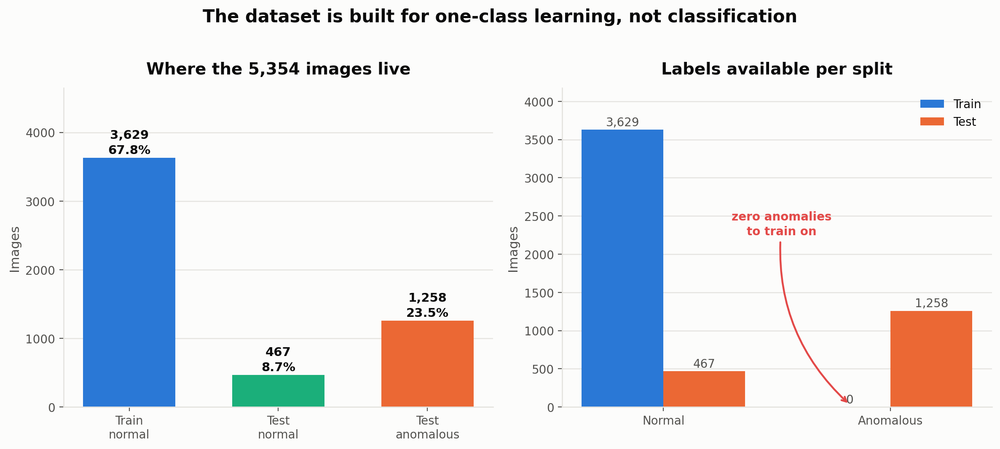

In [6]:
Image(str(plots.fig_composition(manifest)))

  saved fig01_split_overview.png


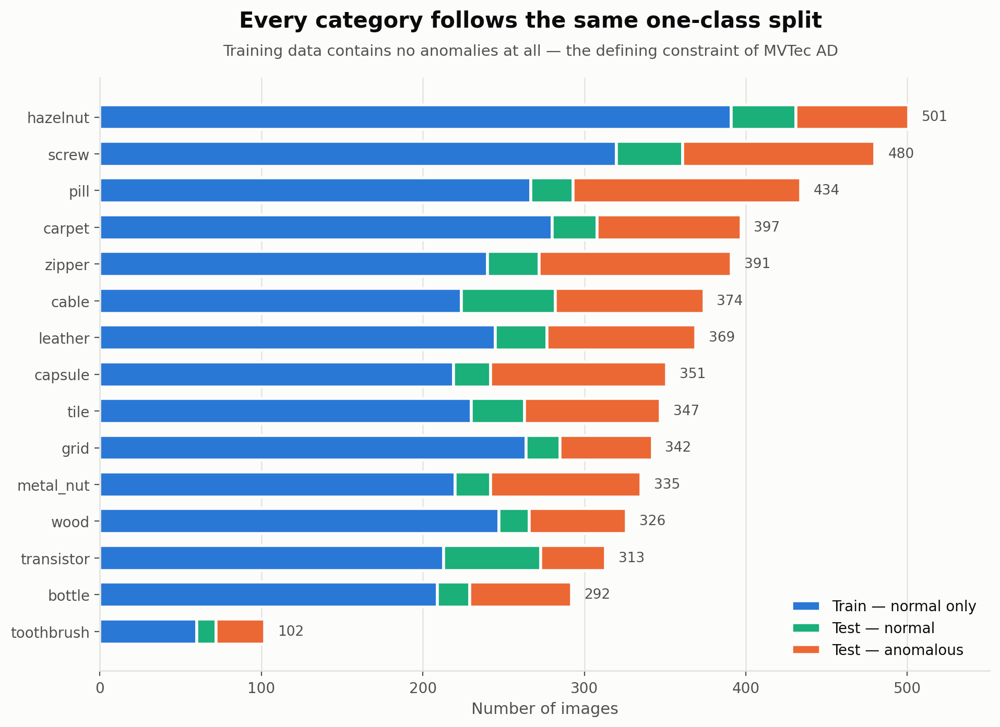

In [7]:
Image(str(plots.fig_split_overview(manifest)))

**Consequence.** With zero anomalies in training, a supervised normal-vs-defect
classifier cannot be fitted - there is no positive class to learn from. The task is
*one-class*: model what "normal" looks like from the 3,629 clean images, then score test
images by how far they deviate.

The 72.9% anomalous share of the test split also means **accuracy is a misleading
metric**: predicting "anomalous" for everything already scores 72.9%. Evaluation has to
use image-level AUROC plus a pixel-level score for localisation.

## 3 - Categories and the defect taxonomy

The 15 categories divide into 5 near-stationary **textures** and 10 centred **objects** -
a distinction that matters because the two behave differently under augmentation.

In [8]:
summary = category_summary(manifest, masks)
summary

,type,resolution,channels,train,test_normal,test_anomalous,defect_types,total,pct_anomalous_in_test,median_defect_area_pct,min_defect_area_pct,max_defect_area_pct
category,,,,,,,,,,,,
hazelnut,object,1024x1024,3,391,40,70,4,501,63.6,1.616,0.233,27.659
screw,object,1024x1024,1,320,41,119,5,480,74.4,0.288,0.099,1.011
pill,object,800x800,3,267,26,141,7,434,84.4,1.033,0.050,41.004
carpet,texture,1024x1024,3,280,28,89,5,397,76.1,1.476,0.165,8.017
zipper,object,1024x1024,1,240,32,119,7,391,78.8,2.354,0.159,11.831
cable,object,1024x1024,3,224,58,92,8,374,61.3,3.681,0.144,22.581
leather,texture,1024x1024,3,245,32,92,5,369,74.2,0.462,0.089,6.859
capsule,object,1000x1000,3,219,23,109,5,351,82.6,0.430,0.037,8.079
tile,texture,840x840,3,230,33,84,5,347,71.8,7.930,0.842,35.487


  saved fig05_normal_samples.png


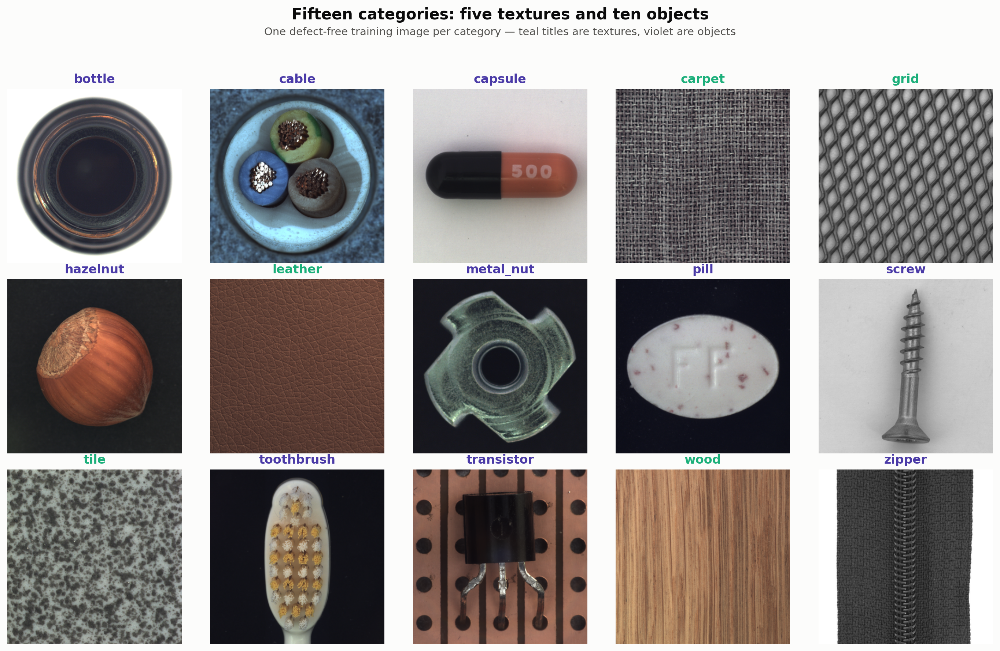

In [9]:
Image(str(plots.fig_normal_samples(manifest)))

Defects are labelled with a category-specific vocabulary - `screw/scratch_neck`,
`carpet/hole`, `cable/missing_wire` - rather than one shared label set.

In [10]:
defect_summary = defect_type_summary(manifest, masks)
print(f"{len(defect_summary)} distinct (category, defect type) pairs")
defect_summary.head(15)

73 distinct (category, defect type) pairs


n_images  median_area_pct  mean_regions
category defect_type                                                  
bottle   broken_small                22            2.437         1.182
         contamination               21            7.248         1.048
         broken_large                20           11.867         1.000
cable    cut_inner_insulation        14            3.098         1.429
         bent_wire                   13            3.599         1.385
         cable_swap                  12            5.818         1.000
         missing_cable               12            7.397         1.000
         combined                    11            4.766         3.727
         cut_outer_insulation        10            1.255         1.700
         missing_wire                10            1.796         1.200
         poke_insulation             10            2.821         1.900
capsule  crack                       23            0.304         1.000
         scratch                     23            0.635         1.174
         faulty_imprint              22            0.278         1.000
         poke                        21            0.225         1.048

images per defect type - min 8, median 17, max 30


  saved fig03_defect_types.png


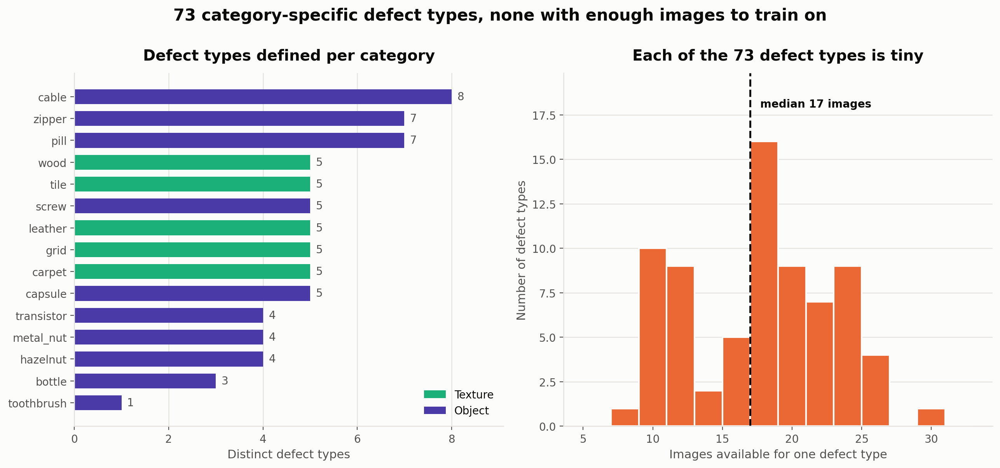

In [11]:
per_type = defect_summary.n_images
print(f"images per defect type - min {per_type.min()}, "
      f"median {per_type.median():.0f}, max {per_type.max()}")
Image(str(plots.fig_defect_types(manifest)))

**Consequence.** Even if the training split *did* contain anomalies, the median defect
type has only 17 examples. That rules out learning a per-defect classifier and confirms
the one-class framing: the model should flag *anything* unlike normal, not recognise
specific named defects.

`toothbrush` is the weak point - 60 training images and a single defect type. It is the
category most likely to produce an unstable score, and worth reporting separately.

## 4 - Acquisition properties

How the images were captured determines the preprocessing pipeline.

In [12]:
acq = manifest.groupby("category").agg(
    resolution=("resolution", "first"),
    pil_mode=("pil_mode", "first"),
    aspect_ratios=("aspect_ratio", "nunique"),
    mean_file_kb=("file_size_kb", "mean"),
).round(1)
acq["channels"] = acq.pil_mode.map({"L": 1, "RGB": 3})
acq.sort_values("resolution")

,resolution,pil_mode,aspect_ratios,mean_file_kb,channels
category,,,,,
capsule,1000x1000,RGB,1,1125.2,3
cable,1024x1024,RGB,1,1317.9,3
carpet,1024x1024,RGB,1,1821.8,3
grid,1024x1024,L,1,460.2,1
hazelnut,1024x1024,RGB,1,1203.3,3
leather,1024x1024,RGB,1,1389.8,3
screw,1024x1024,L,1,398.0,1
toothbrush,1024x1024,RGB,1,1047.1,3
transistor,1024x1024,RGB,1,1257.4,3


In [13]:
print("Distinct resolutions:", sorted(manifest.resolution.unique()))
print("All images square   :", bool((manifest.width == manifest.height).all()))
print("Greyscale categories:", sorted(manifest.loc[manifest.pil_mode == "L", "category"].unique()))
print("Greyscale images    :", int((manifest.pil_mode == "L").sum()))

Distinct resolutions: ['1000x1000', '1024x1024', '700x700', '800x800', '840x840', '900x900']
All images square   : True
Greyscale categories: ['grid', 'screw', 'zipper']
Greyscale images    : 1213


  saved fig04_image_properties.png


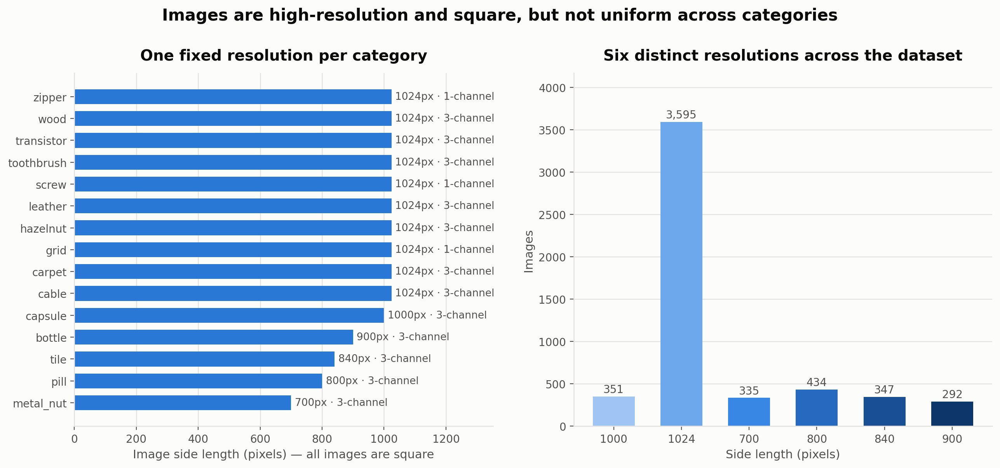

In [14]:
Image(str(plots.fig_image_properties(manifest)))

  saved fig09_appearance.png


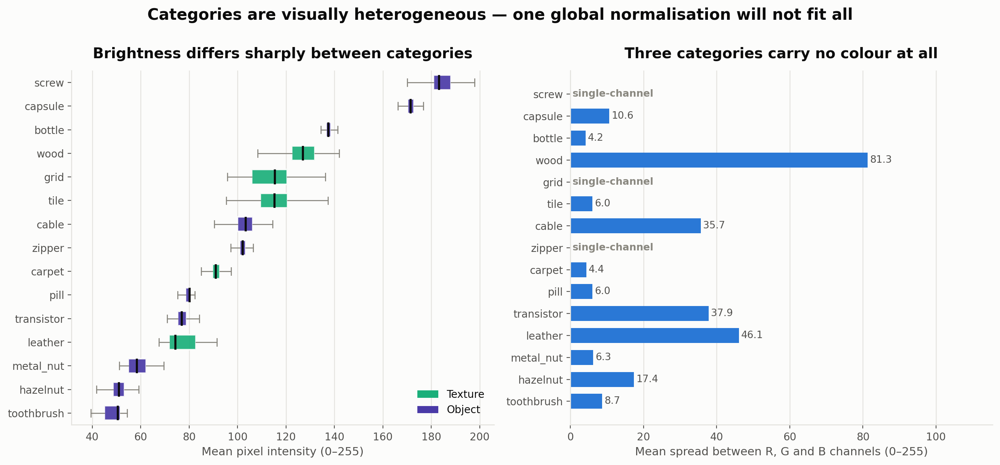

In [15]:
Image(str(plots.fig_appearance(images, manifest)))

**Consequence.** Every image is square, so resizing introduces no aspect distortion.
But resolution varies from 700 px to 1024 px and three categories (`grid`, `screw`,
`zipper` - 1,213 images) are single-channel, so the loader must replicate the channel
before an ImageNet-pretrained backbone will accept them.

Mean brightness ranges from roughly 48 (`toothbrush`) to 185 (`screw`). A single global
normalisation would leave some categories far off-centre - another reason the standard
MVTec protocol trains **one model per category**.

## 5 - Defect geometry

The ground-truth masks make this the most informative part of the EDA: they say exactly
how much of each image is defective, and where.

  saved fig06_defect_examples.png


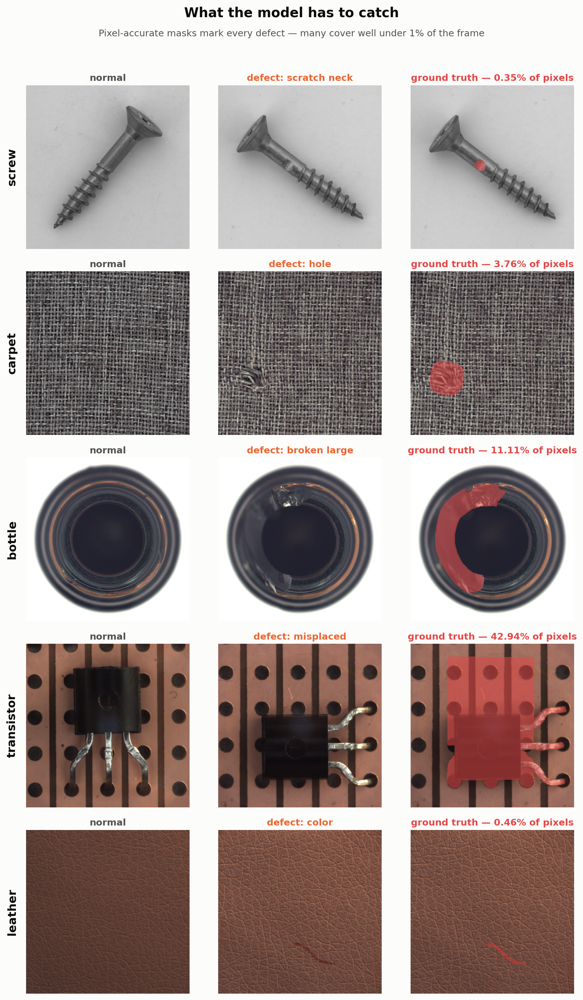

In [16]:
Image(str(plots.fig_defect_examples(manifest)))

In [17]:
area = masks.defect_area_pct
area.describe(percentiles=[0.05, 0.25, 0.5, 0.75, 0.95]).round(3)

count    1258.000
mean        4.388
std         8.741
min         0.037
5%          0.182
25%         0.494
50%         1.544
75%         3.887
95%        16.686
max        49.321
Name: defect_area_pct, dtype: float64

In [18]:
for threshold in (0.5, 1, 5, 10):
    print(f"defects covering < {threshold:>4}% of the image : "
          f"{100 * (area < threshold).mean():5.1f}%")

defects covering <  0.5% of the image :  25.2%
defects covering <    1% of the image :  39.7%
defects covering <    5% of the image :  80.7%
defects covering <   10% of the image :  90.3%


  saved fig07_defect_area.png


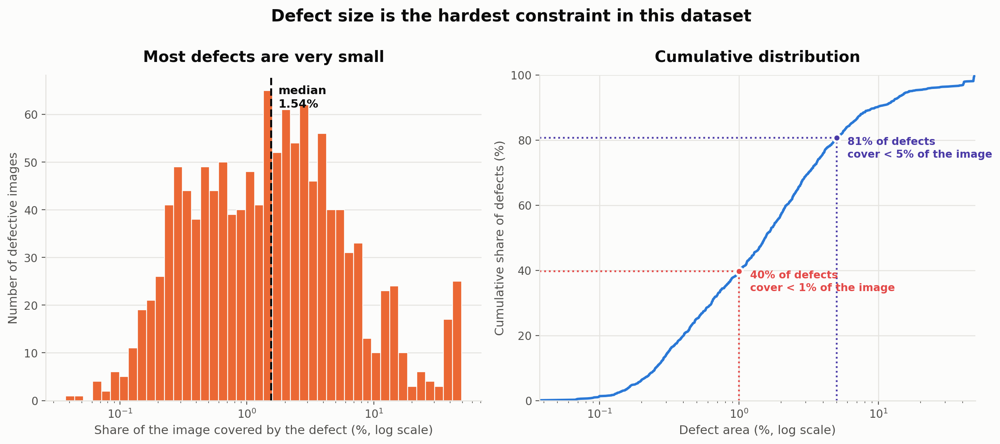

In [19]:
Image(str(plots.fig_defect_area(masks)))

  saved fig08_defect_area_by_category.png


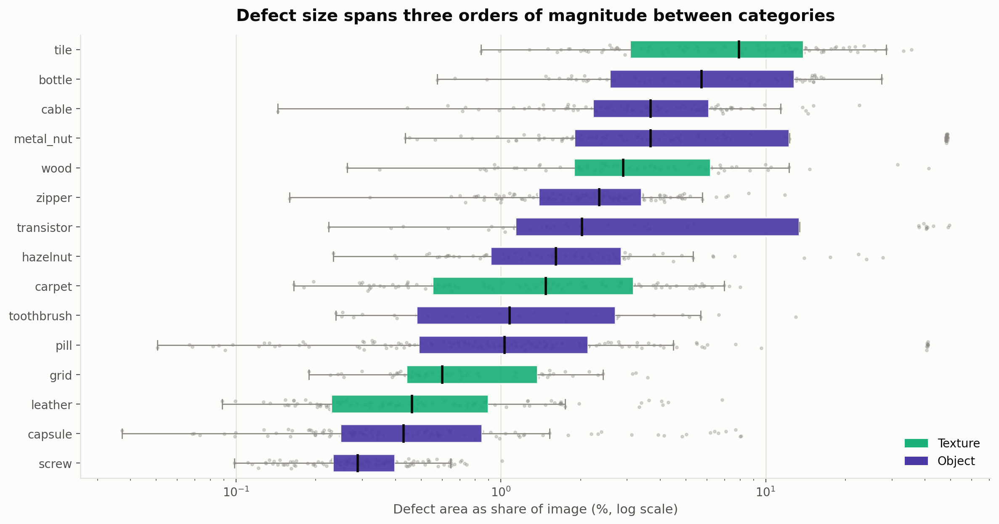

In [20]:
Image(str(plots.fig_defect_area_by_category(masks, manifest)))

**Consequence - this is the tightest constraint in the project.** The median defect
covers 1.54% of its image and 39.7% cover under 1%. Resizing a 1024x1024 image to the
usual 224x224 shrinks a 0.3% defect (`screw`) to roughly 15 pixels. Two implications:

- keep the input resolution high (256-512 px), or work on patches;
- score at the **feature-map level**, not from a single pooled image embedding, so small
  local deviations are not averaged away.

In [21]:
print(f"single-region masks    : {100 * (masks.n_defect_regions == 1).mean():.1f}%")
print(f"max regions in one mask: {masks.n_defect_regions.max()}")
masks.n_defect_regions.value_counts().sort_index().head(8)

single-region masks    : 75.8%
max regions in one mask: 17


n_defect_regions
1    953
2    161
3     78
4     29
5     13
6     10
7      4
8      3
Name: count, dtype: int64

  saved fig10_defect_location.png


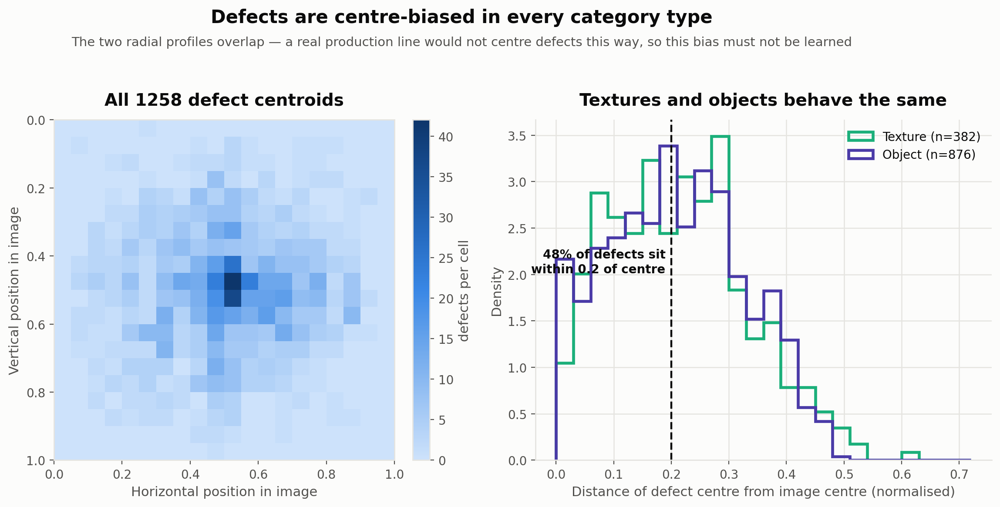

In [22]:
Image(str(plots.fig_defect_location(masks, manifest)))

**Consequence.** Defects sit near the image centre far more often than chance - 48%
within 0.2 of it - and textures and objects behave identically in this respect. That is an
artefact of how MVTec framed its shots, not a property of defects in general. A model that
learns "anomalies live in the middle" would not transfer to a real production line, so
centre-cropping should be avoided and random-crop augmentation is worth using to break the
bias.

## 6 - Is the test split drawn from the same distribution?

A one-class model assumes test normals look like training normals. Worth checking rather
than assuming.

In [23]:
df = images.merge(
    manifest[["image_path", "category", "split", "is_anomalous"]], on="image_path"
)
train_mean = df[df.split == "train"].groupby("category").mean_intensity.mean()
test_norm_mean = (
    df[(df.split == "test") & (df.is_anomalous == 0)].groupby("category").mean_intensity.mean()
)

drift = (test_norm_mean - train_mean).sort_values().round(2).to_frame("test_normal_minus_train")
drift["within_5_levels"] = drift.test_normal_minus_train.abs() <= 5
drift

,test_normal_minus_train,within_5_levels
category,,
screw,-13.82,False
grid,-10.09,False
tile,-3.61,True
capsule,-1.61,True
wood,-1.46,True
zipper,-0.69,True
pill,0.01,True
toothbrush,0.10,True
transistor,0.26,True


  saved fig11_train_test_shift.png


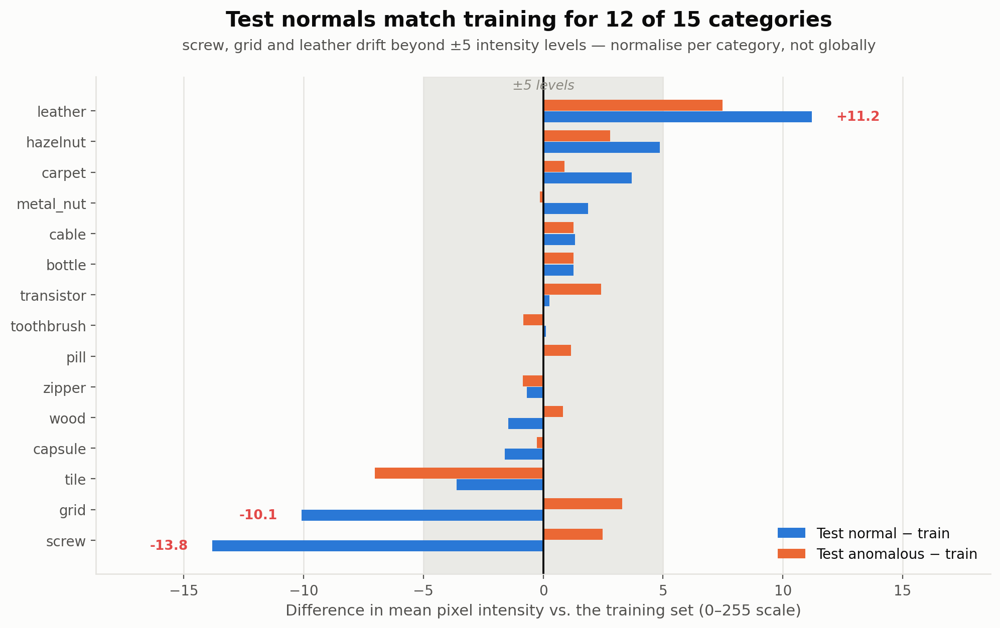

In [24]:
Image(str(plots.fig_train_test_shift(images, manifest)))

**Consequence.** For 12 of 15 categories the normal test images sit within +/-5
intensity levels of the training set - close enough to treat as the same distribution.
`screw` (-13.8), `leather` (+11.2) and `grid` (-10.1) drift further, so per-category
normalisation statistics should be computed from that category's own training split rather
than shared across the dataset.

## 7 - What this means for week 2

The EDA settles six design decisions:

| Finding | Decision it forces |
|---|---|
| 0 anomalies in 3,629 training images | One-class / unsupervised method - no supervised classifier |
| 73 defect types, median 17 images each | Do not model defect classes; detect deviation from normal |
| 72.9% of the test split is anomalous | Report AUROC, not accuracy |
| Median defect covers 1.54% of the image | High input resolution and patch- or feature-level scoring |
| 6 resolutions; 3 categories single-channel | Loader must resize consistently and expand channels |
| Brightness spans 48-185; 3 categories drift | Per-category models and per-category normalisation |

**Baseline to build first:** a pretrained-CNN feature-embedding method (PaDiM or
PatchCore). Both fit the constraints exactly - they need only normal images, they compare
patch features rather than whole-image embeddings, and they produce a pixel-level anomaly
map that the ground-truth masks can score directly.

**Evaluation protocol:** per-category image-level AUROC and pixel-level AUROC, averaged
across the 15 categories, with `toothbrush` flagged as the small-sample category.

In [25]:
facts = headline_facts(manifest, masks, images)
for key, value in facts.items():
    print(f"{key:<32} {value}")

n_images                         5354
n_categories                     15
n_textures                       5
n_objects                        10
n_train                          3629
n_test                           1725
n_test_normal                    467
n_test_anomalous                 1258
pct_test_anomalous               72.9
n_train_anomalies                0
n_defect_types                   73
median_images_per_defect_type    17
min_images_per_defect_type       8
n_masks                          1258
median_defect_area_pct           1.54
pct_defects_under_1pct           39.7
pct_defects_under_5pct           80.7
smallest_defect_pct              0.037
largest_defect_pct               49.3
pct_single_region_masks          75.8
max_defect_regions               17
n_resolutions                    6
resolutions                      ['1000x1000', '1024x1024', '700x700', '800x800', '840x840', '900x900']
greyscale_categories             ['grid', 'screw', 'zipper']
n_greyscale_images   